In [39]:
from tensorflow.keras.models import Model, load_model
import os
from tensorflow.keras.preprocessing.image import img_to_array, load_img, ImageDataGenerator
import numpy as np
from skimage import io, color
from keras.preprocessing import image
import numpy as np
from skimage import io, color, transform
from scipy.spatial.distance import cdist
from matplotlib import pyplot as plt
import matplotlib.gridspec as gridspec
import os
def read_image(img_id, dir, image_size):
    try:
        img = load_img(dir + "/" + img_id, target_size=(image_size,image_size))
        img = img_to_array(img)
        return img
    except:
        return None
    
def get_images(files, image_size):
    images = []
    for image in files:
        img = read_image(image, directory, image_size)
        if not img is None:
            img = np.array(img, dtype=float)
            images.append(img)
    images = np.array(images, dtype=float)
    return images

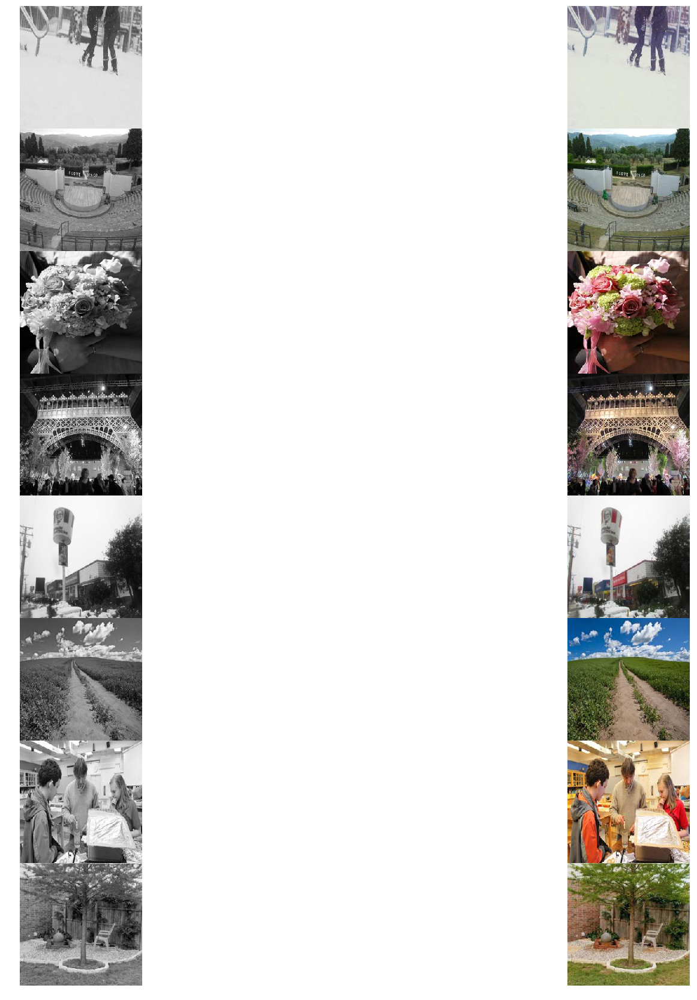

In [40]:
image_size = 256
directory = "/home/carlos/Image_Colorization/data/Test"
files = [f for f in os.listdir(directory)[60:68] if os.path.isfile(os.path.join(directory, f))]
images = get_images(files, image_size)

images = images * 1.0/255
lab_images = color.rgb2lab(images)
bw_lab_images = np.copy(lab_images)
bw_lab_images[:, :, :, 1:] = 0

rows = 8
columns = 2
f, axarr = plt.subplots(rows,columns, figsize=(30, 30), sharex=True)
for i in range(0, rows):
    axarr[i, 0].imshow(color.lab2rgb(bw_lab_images[i]))
    axarr[i, 0].axis("off")
    
    axarr[i, 1].imshow(images[i])
    axarr[i, 1].axis("off")

plt.subplots_adjust(hspace=0)
plt.show()

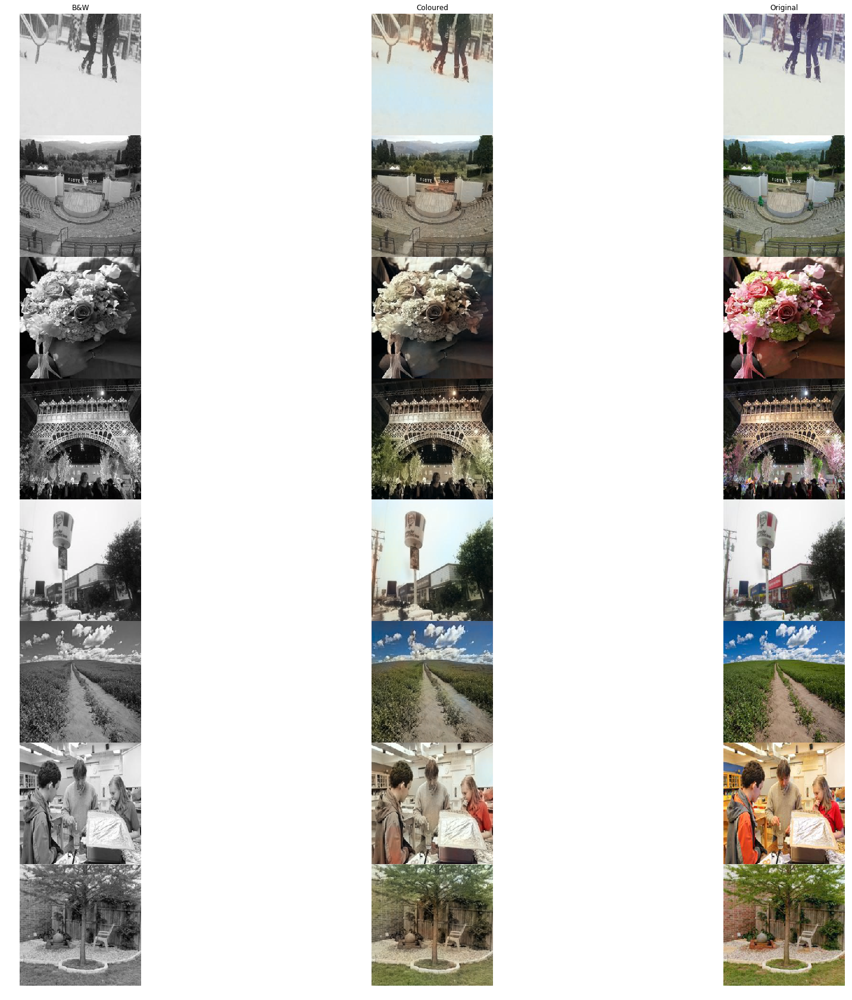

In [41]:
image_size = 256
directory = "/home/carlos/Image_Colorization/data/Test"

model = load_model("/home/carlos/Image_Colorization/output/MSE/2019-02-15--14h08m/model.h5")

images = get_images(files, image_size)
images = images * 1.0/255
lab_images = color.rgb2lab(images)
bw_lab_images = np.copy(lab_images)
bw_lab_images[:, :, :, 1:] = 0

inputs_2 = bw_lab_images[:, :, :, 0] - 50
inputs_2 = inputs_2 / 50
inputs_2 = inputs_2.reshape(inputs_2.shape+(1,))

output = model.predict(inputs_2)
output = output * 128

combined_mse = np.concatenate((np.expand_dims(bw_lab_images[:, :, :, 0], axis=3), output), axis=3)
rows = 8
columns = 3
f, axarr = plt.subplots(rows,columns, figsize=(30, 30), sharex=True)

for i in range(0, rows):
    axarr[i, 0].imshow(color.lab2rgb(bw_lab_images[i]))
    axarr[i, 0].axis("off")

    axarr[i, 1].imshow(color.lab2rgb(combined_mse[i]))
    axarr[i, 1].axis("off")

    axarr[i, 2].imshow(images[i])   
    axarr[i, 2].axis("off")

axarr[0, 0].set_title("B&W")
axarr[0, 1].set_title("Coloured")
axarr[0, 2].set_title("Original")
plt.subplots_adjust(hspace=0)
plt.show()

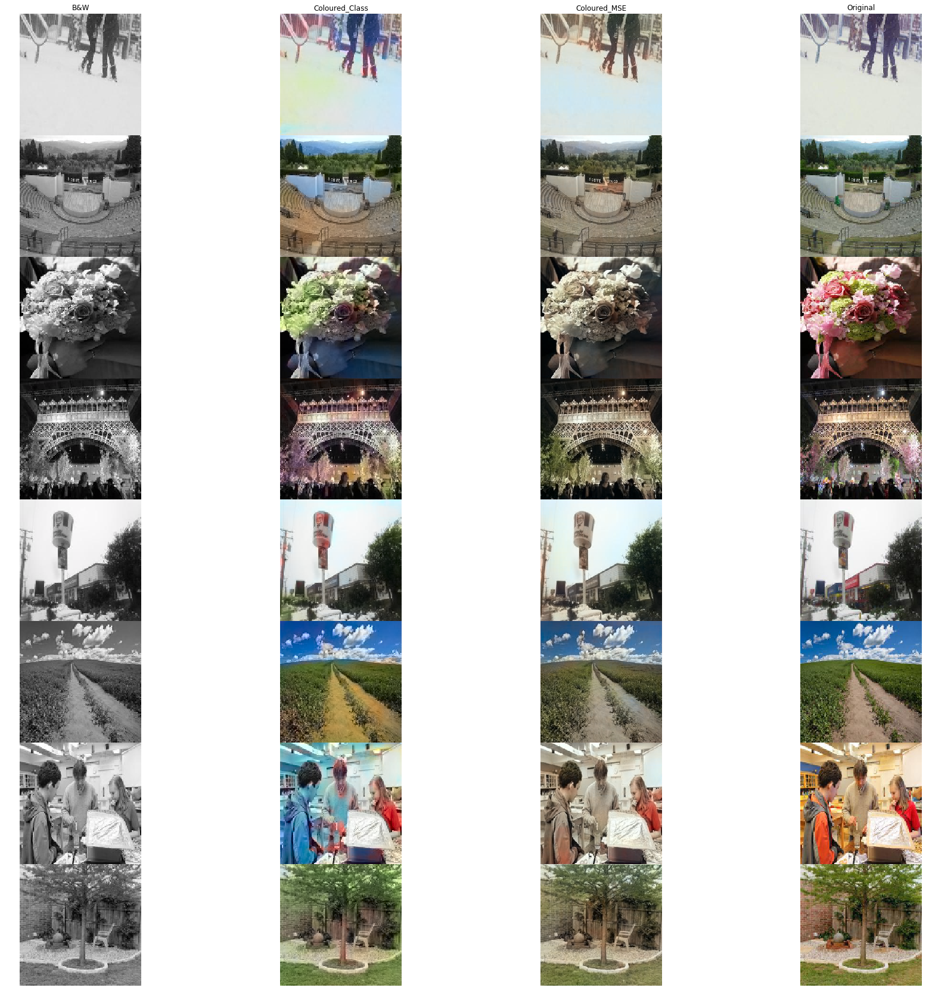

In [42]:
image_size = 128
directory = "/home/carlos/Image_Colorization/data/Test"
model = load_model("/home/carlos/Image_Colorization/output/2019-02-04--10h42m/model.h5")
buckets = np.load("../model/pts_in_hull.npy")

images = get_images(files, image_size)
images = images * 1.0/255
lab_images = color.rgb2lab(images)
bw_lab_images = np.copy(lab_images)
bw_lab_images[:, :, :, 1:] = 0

inputs_2 = bw_lab_images[:, :, :, 0] - 50
inputs_2 = inputs_2 / 50
inputs_2 = inputs_2.reshape(inputs_2.shape+(1,))

output = model.predict(inputs_2)
output = output.reshape(8, image_size, image_size, 313)

values = np.arange(0, 313)
t = 0.38
transformed = np.exp(np.log(output + 1e-8)/t)
sum_colors = np.expand_dims(np.sum(transformed, axis=3), axis=3)
result = transformed/sum_colors
output = np.dot(result, buckets)

combined_class = np.concatenate((np.expand_dims(bw_lab_images[:, :, :, 0], axis=3), output), axis=3)

rows = 8
columns = 4
f, axarr = plt.subplots(rows,columns, figsize=(30, 30))

for i in range(0, rows):
    axarr[i, 0].imshow(color.lab2rgb(bw_lab_images[i]))
    axarr[i, 0].axis("off")

    axarr[i, 1].imshow(color.lab2rgb(combined_class[i]))
    axarr[i, 1].axis("off")

    axarr[i, 2].imshow(color.lab2rgb(combined_mse[i]))
    axarr[i, 2].axis("off")

    axarr[i, 3].imshow(images[i])
    axarr[i, 3].axis("off")

axarr[0, 0].set_title("B&W")
axarr[0, 1].set_title("Coloured_Class")
axarr[0, 2].set_title("Coloured_MSE")
axarr[0, 3].set_title("Original")
plt.subplots_adjust(hspace=0)
plt.show()

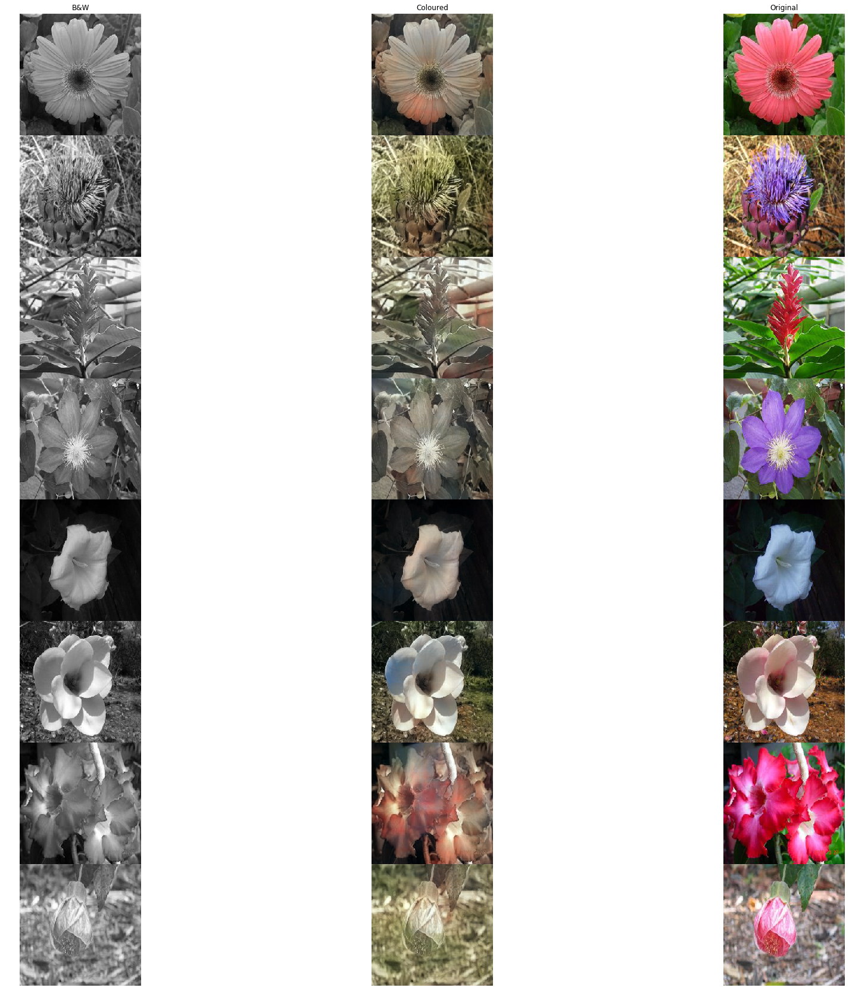

In [46]:
image_size = 256
directory = "/home/carlos/Image_Colorization/data/flowers_val/flowers_val"
files = [f for f in os.listdir(directory)[60:68] if os.path.isfile(os.path.join(directory, f))]
#TRAIN MSE FLOWERS AGAIN
model = load_model("/home/carlos/Image_Colorization/output/MSE/2019-02-15--14h08m/model.h5")

images = get_images(files, image_size)
images = images * 1.0/255
lab_images = color.rgb2lab(images)
bw_lab_images = np.copy(lab_images)
bw_lab_images[:, :, :, 1:] = 0

inputs_2 = bw_lab_images[:, :, :, 0] - 50
inputs_2 = inputs_2 / 50
inputs_2 = inputs_2.reshape(inputs_2.shape+(1,))

output = model.predict(inputs_2)
output = output * 128

combined_mse = np.concatenate((np.expand_dims(bw_lab_images[:, :, :, 0], axis=3), output), axis=3)
rows = 8
columns = 3
f, axarr = plt.subplots(rows,columns, figsize=(30, 30), sharex=True)

for i in range(0, rows):
    axarr[i, 0].imshow(color.lab2rgb(bw_lab_images[i]))
    axarr[i, 0].axis("off")
    
    axarr[i, 1].imshow(color.lab2rgb(combined_mse[i]))
    axarr[i, 1].axis("off")
    
    axarr[i, 2].imshow(images[i])
    axarr[i, 2].axis("off")
    
axarr[0, 0].set_title("B&W")
axarr[0, 1].set_title("Coloured")
axarr[0, 2].set_title("Original")
plt.subplots_adjust(hspace=0)
plt.show()

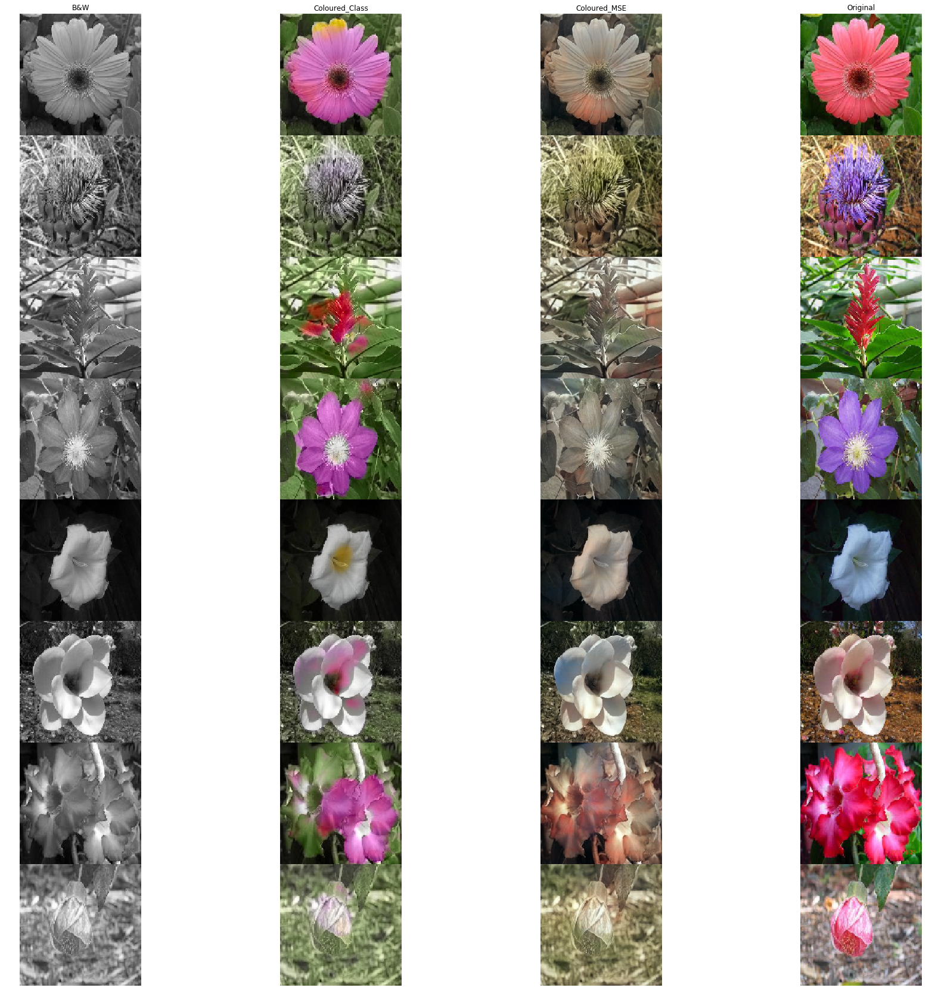

In [45]:

image_size = 128
directory = "/home/carlos/Image_Colorization/data/flowers_val/flowers_val"
files = [f for f in os.listdir(directory)[60:68] if os.path.isfile(os.path.join(directory, f))]

model = load_model("/home/carlos/Image_Colorization/output/flowers_aug_2/best.hdf5")
buckets = np.load("../model/pts_in_hull.npy")

images = get_images(files, image_size)
images = images * 1.0/255
lab_images = color.rgb2lab(images)
bw_lab_images = np.copy(lab_images)
bw_lab_images[:, :, :, 1:] = 0

inputs_2 = bw_lab_images[:, :, :, 0] - 50
inputs_2 = inputs_2 / 50
inputs_2 = inputs_2.reshape(inputs_2.shape+(1,))

output = model.predict(inputs_2)
output = output.reshape(8, image_size, image_size, 313)

values = np.arange(0, 313)
t = 0.38
transformed = np.exp(np.log(output + 1e-8)/t)
sum_colors = np.expand_dims(np.sum(transformed, axis=3), axis=3)
result = transformed/sum_colors
output = np.dot(result, buckets)

combined_class = np.concatenate((np.expand_dims(bw_lab_images[:, :, :, 0], axis=3), output), axis=3)

rows = 8
columns = 4
f, axarr = plt.subplots(rows,columns, figsize=(30, 30))

for i in range(0, rows):
    axarr[i, 0].imshow(color.lab2rgb(bw_lab_images[i]))
    axarr[i, 0].axis("off")

    axarr[i, 1].imshow(color.lab2rgb(combined_class[i]))
    axarr[i, 1].axis("off")

    axarr[i, 2].imshow(color.lab2rgb(combined_mse[i]))
    axarr[i, 2].axis("off")

    axarr[i, 3].imshow(images[i])
    axarr[i, 3].axis("off")

axarr[0, 0].set_title("B&W")
axarr[0, 1].set_title("Coloured_Class")
axarr[0, 2].set_title("Coloured_MSE")
axarr[0, 3].set_title("Original")
plt.subplots_adjust(hspace=0)
plt.show()

/home/carlos/tf-gpu/local/lib/python2.7/site-packages/skimage/color/colorconv.py:993: UserWarning: Color data out of range: Z < 0 in 2 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)
/home/carlos/tf-gpu/local/lib/python2.7/site-packages/skimage/color/colorconv.py:993: UserWarning: Color data out of range: Z < 0 in 14 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)
/home/carlos/tf-gpu/local/lib/python2.7/site-packages/skimage/color/colorconv.py:993: UserWarning: Color data out of range: Z < 0 in 7 pixels
  warn('Color data out of range: Z < 0 in %s pixels' % invalid[0].size)


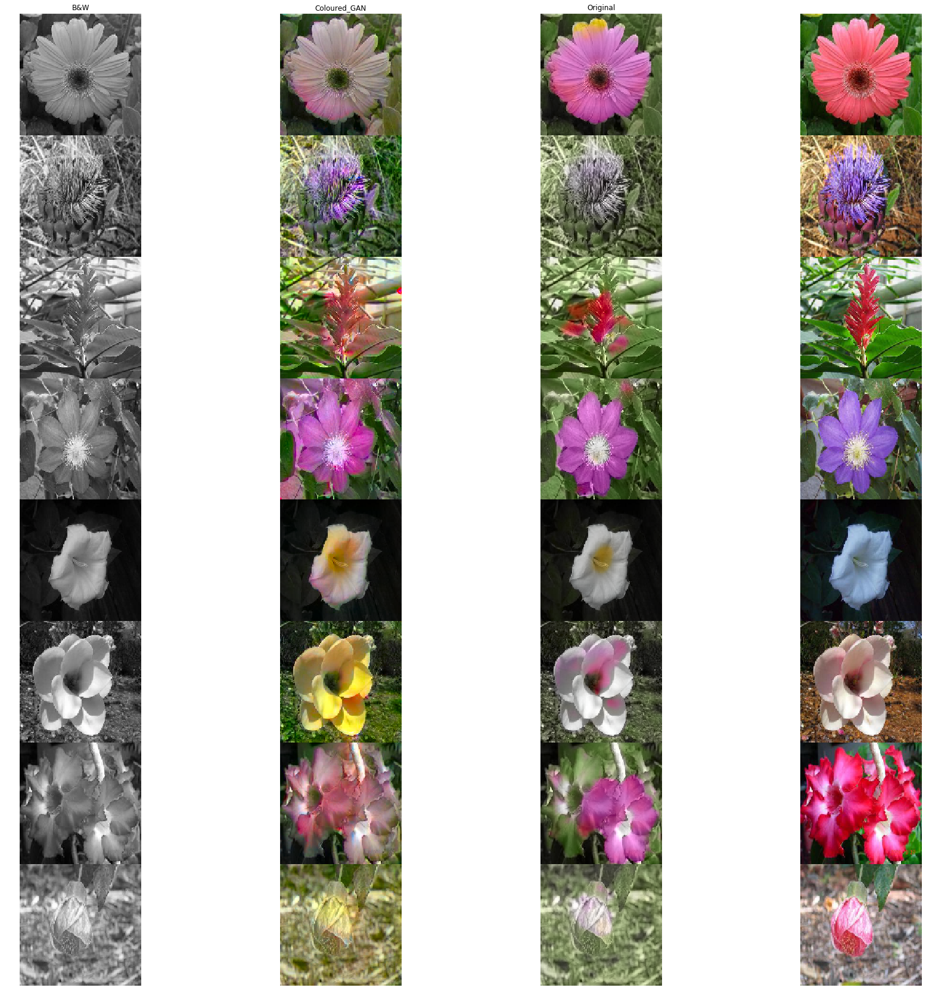

In [48]:
from keras.models import Model, load_model
image_size = 128
directory = "/home/carlos/Image_Colorization/data/flowers_val/flowers_val"
files = [f for f in os.listdir(directory)[60:68] if os.path.isfile(os.path.join(directory, f))]
model = load_model("/home/carlos/Image_Colorization/output/GAN/2019-02-26--19h16m/generator.h5")

images = get_images(files, image_size)
images = images * 1.0/255
lab_images = color.rgb2lab(images)
bw_lab_images = np.copy(lab_images)
bw_lab_images[:, :, :, 1:] = 0

inputs_2 = bw_lab_images[:, :, :, 0] - 50
inputs_2 = inputs_2 / 50
inputs_2 = inputs_2.reshape(inputs_2.shape+(1,))

output = model.predict(inputs_2)
output = output * 128

combined_gan = np.concatenate((np.expand_dims(bw_lab_images[:, :, :, 0], axis=3), output), axis=3)
rows = 8
columns = 4
f, axarr = plt.subplots(rows,columns, figsize=(30, 30), sharex=True)

for i in range(0, rows):
    axarr[i, 0].imshow(color.lab2rgb(bw_lab_images[i]))
    axarr[i, 0].axis("off")
    
    axarr[i, 1].imshow(color.lab2rgb(combined_gan[i]))
    axarr[i, 1].axis("off")
    
    axarr[i, 2].imshow(color.lab2rgb(combined_class[i]))
    axarr[i, 2].axis("off")
    
    axarr[i, 3].imshow(images[i])
    axarr[i, 3].axis("off")
    
axarr[0, 0].set_title("B&W")
axarr[0, 1].set_title("Coloured_GAN")
axarr[0, 2].set_title("Coloured_Class")
axarr[0, 3].set_title("Original")
plt.subplots_adjust(hspace=0)
plt.show()